# **Image processing algorithms**

Image processing algorithms are techniques used to perform operations on images to enhance, analyze, or extract information from them.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

## Zooming and Shrinking

Zooming and shrinking images can be achieved using image resizing techniques. In OpenCV, the cv2.resize() function is used to zoom (enlarge) or shrink (reduce) an image by adjusting its dimensions.

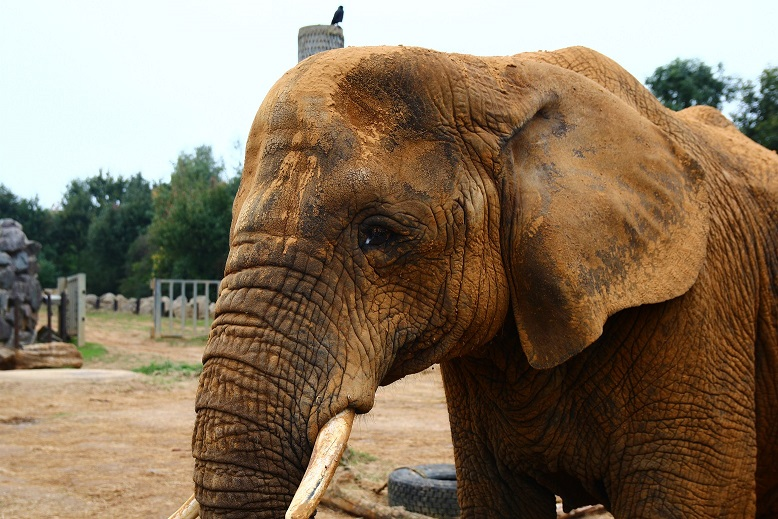

In [4]:
image = cv2.imread('/content/__results___5_0.png')
cv2_imshow(image)

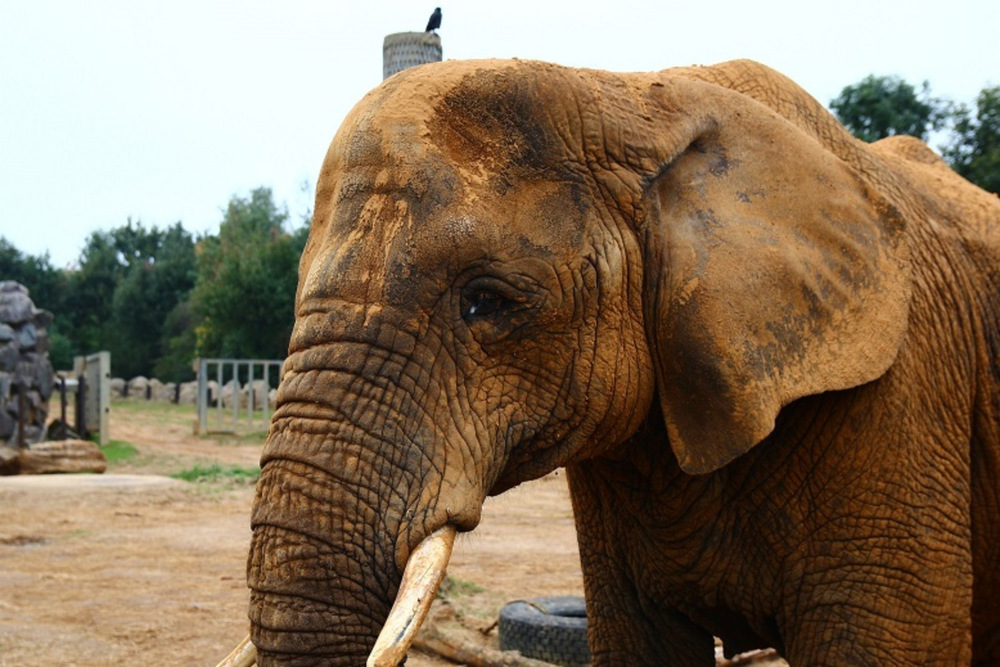

In [5]:
# Zoom the image by scaling it up (2x zoom)

zoomed_image = cv2.resize(image, None, fx=2.0, fy=2.0, interpolation=cv2.INTER_LINEAR)

cv2_imshow(zoomed_image)

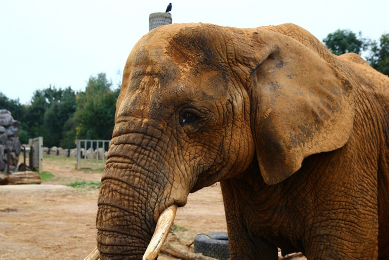

In [6]:
# Shrink the image by scaling it down (0.5x)
shrunk_image = cv2.resize(image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)

cv2_imshow(shrunk_image)

## Noise in Images


Noise in images refers to random variations in pixel values that result in undesirable visual artifacts, often introduced during image acquisition or transmission.

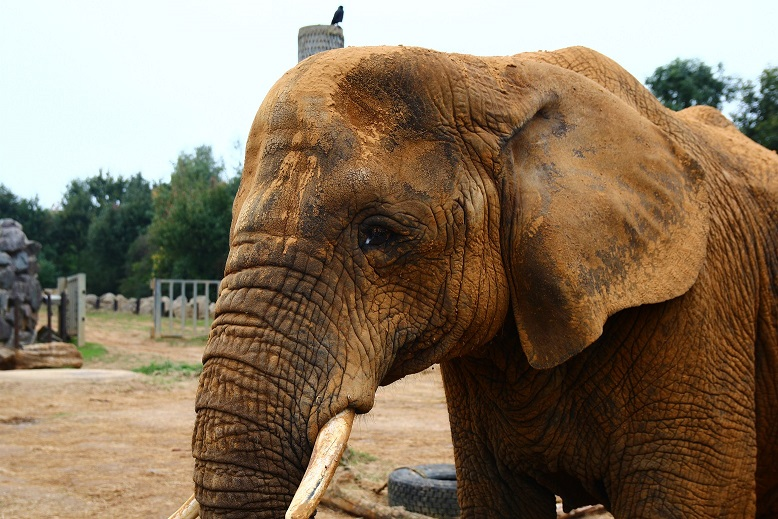

In [7]:
noisy_image = cv2.imread('/content/__results___5_0.png')
cv2_imshow(noisy_image)

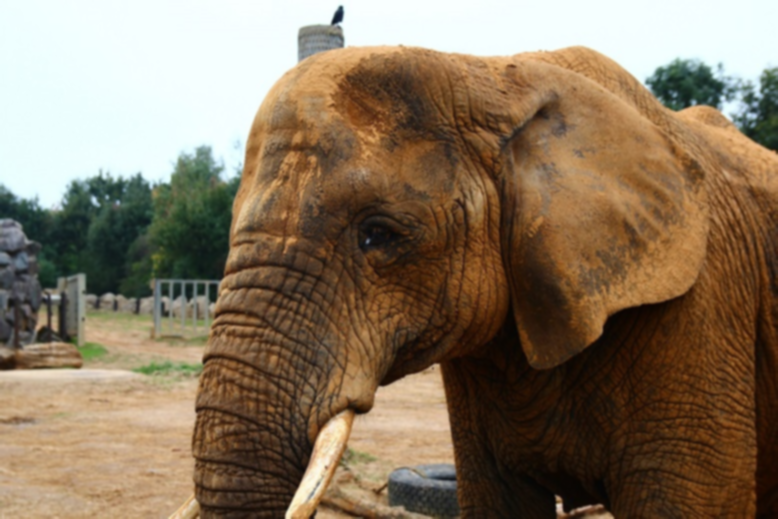

In [8]:
# Denoise the image using OpenCV
denoised_image = cv2.GaussianBlur(noisy_image, (5, 5), 0)

cv2_imshow(denoised_image)

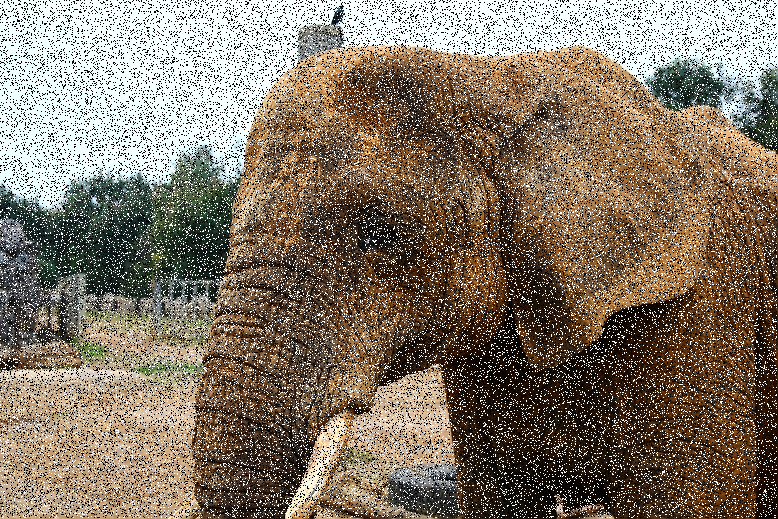

In [11]:
#Adding Salt and Pepper Noise

image = cv2.imread('/content/__results___5_0.png')
output = np.copy(image)

salt_prob = 0.05
pepper_prob = 0.05

# Add salt noise
num_salt = np.ceil(salt_prob * image.size)
coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
output[coords[0], coords[1], :] = 255

# Add pepper noise
num_pepper = np.ceil(pepper_prob * image.size)
coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
output[coords[0], coords[1], :] = 0

cv2_imshow(output)

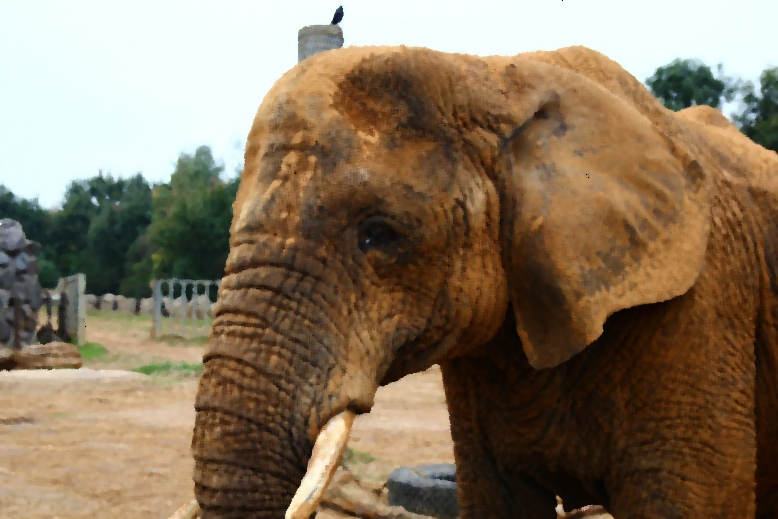

In [12]:
# Median Filter

median_filtered_image = cv2.medianBlur(output, 5)

cv2_imshow(median_filtered_image)

**Reducing Noise:**

To remove noise from images, you can use various denoising techniques such as:

**Median Filtering**: Great for removing salt and pepper noise.

**Gaussian Blurring**: Reduces Gaussian noise.

**Bilateral Filtering**: Smooths an image while preserving edges.

## Image Augmentation

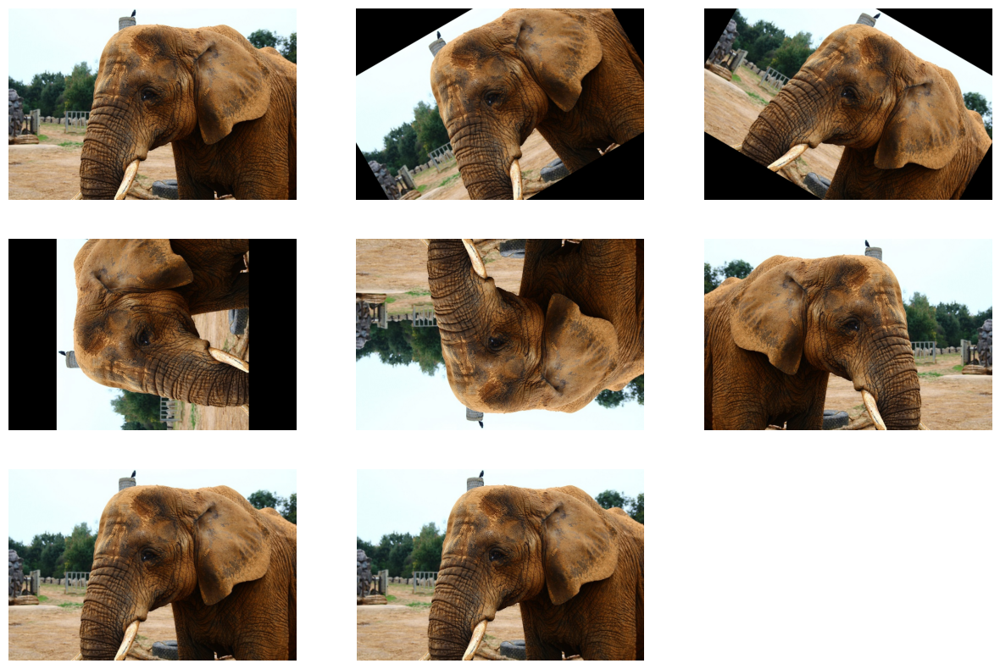

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def augment_image(image):
    augmented_images = []

    # 1. Original Image
    augmented_images.append(image)

    # 2. Rotation
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    for angle in [30, -30, 90]:
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(image, M, (w, h))
        augmented_images.append(rotated)

    # 3. Flipping
    flipped_h = cv2.flip(image, 0)
    flipped_v = cv2.flip(image, 1)
    augmented_images.append(flipped_h)
    augmented_images.append(flipped_v)

    # 4. Scaling
    scaled_up = cv2.resize(image, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR)
    scaled_down = cv2.resize(image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
    augmented_images.append(scaled_up)
    augmented_images.append(scaled_down)

    return augmented_images


image = cv2.imread('/content/__results___5_0.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


augmented_images = augment_image(image)


plt.figure(figsize=(15, 10))
for i, aug_image in enumerate(augmented_images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(aug_image)
    plt.axis('off')
plt.show()


## Transformations

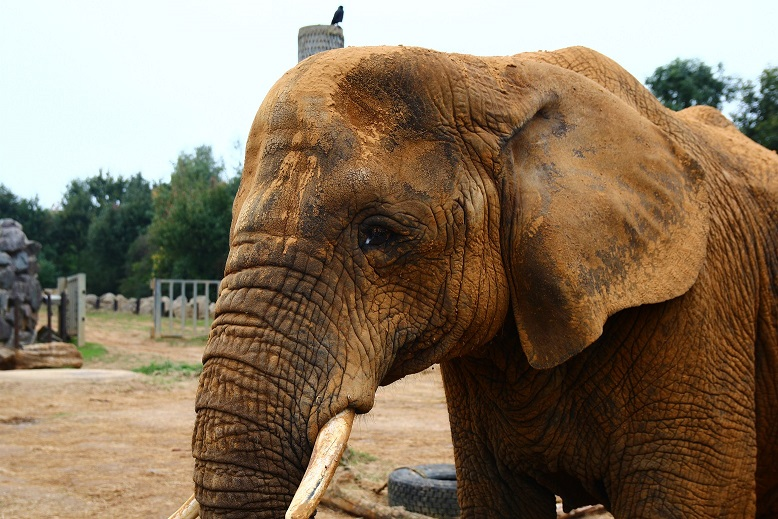

In [14]:
image = cv2.imread('/content/__results___5_0.png')
cv2_imshow(image)

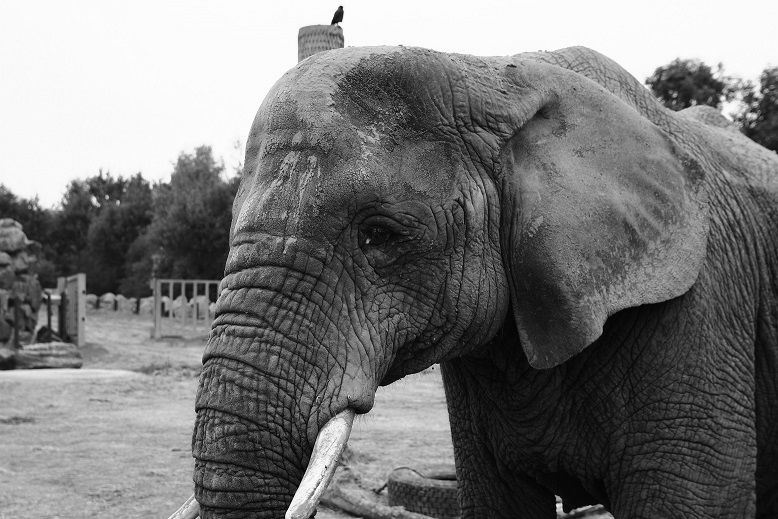

In [15]:
# Convert the image to gray-scale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv2_imshow(gray_image)

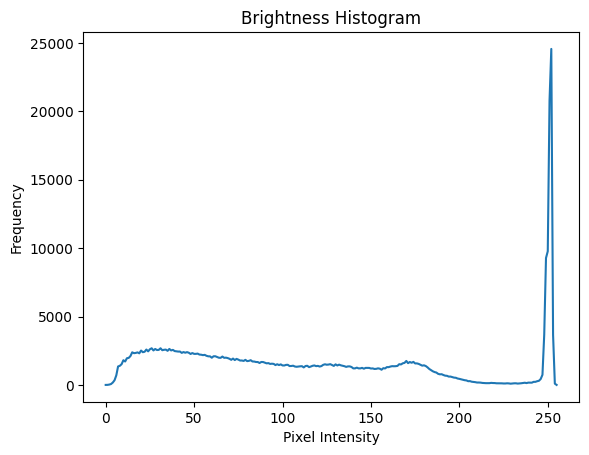

In [16]:
#Brightness Histogram

histogram = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

plt.plot(histogram)
plt.title('Brightness Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

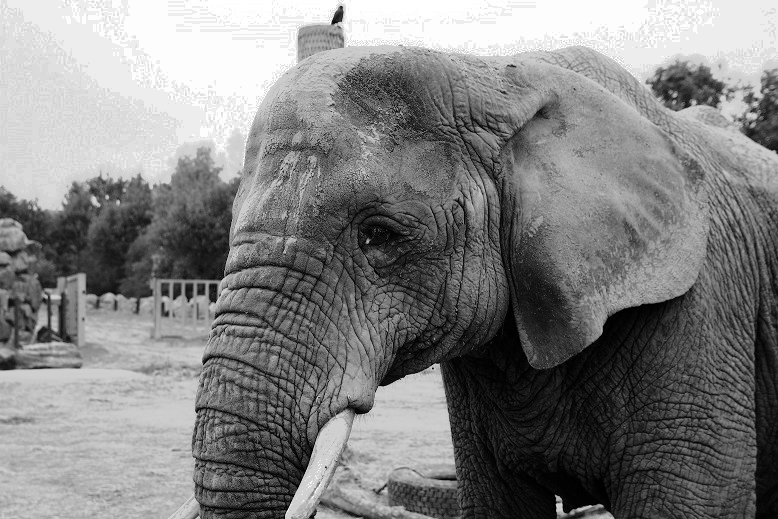

In [17]:
# Histogram Equalization

equalized_image = cv2.equalizeHist(gray_image)

cv2_imshow(equalized_image)

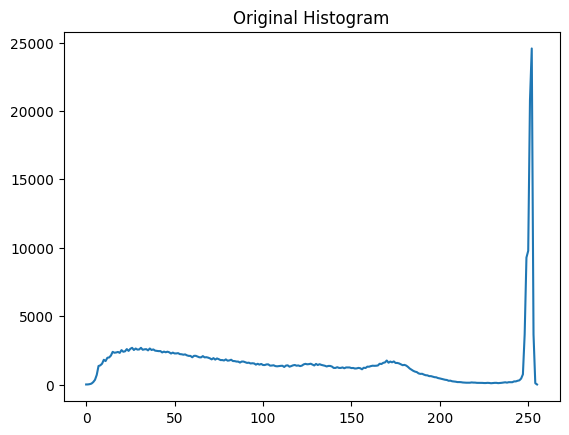

In [18]:
hist_original = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

plt.plot(hist_original)
plt.title('Original Histogram')

plt.show()

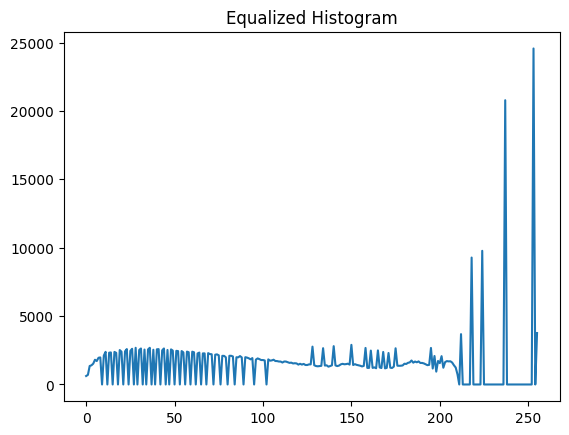

In [19]:
# Equalized image histogram
hist_equalized = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

plt.plot(hist_equalized)
plt.title('Equalized Histogram')

plt.show()

**Gray-scale Transformation:** Converts the image to shades of gray by averaging or weighting RGB channels.

**Brightness Histogram:** Visualizes the distribution of pixel intensity values, helping understand how brightness is spread across the image.

**Histogram Equalization:** Enhances contrast by redistributing pixel intensity values, making the image clearer in areas where the original image was too dark or too bright.

## Image Filtering

Image filtering is a key technique used in image processing to enhance or smooth an image, reduce noise, or extract features

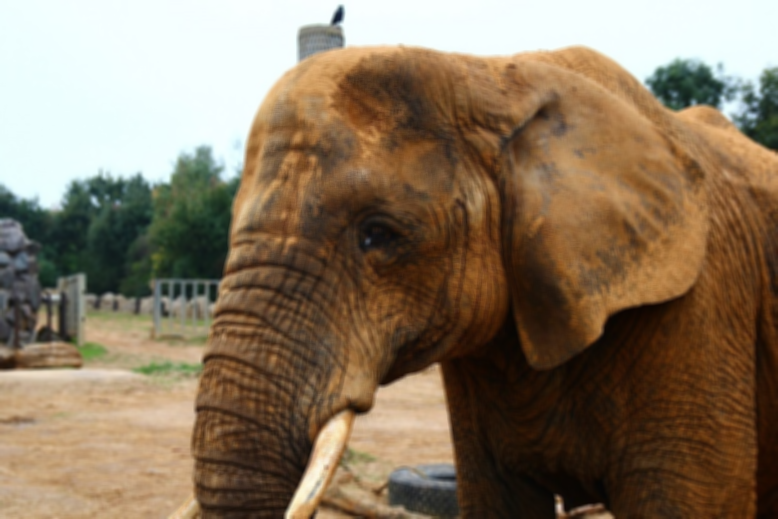

In [20]:
#Averaging Filter
averaged_image = cv2.blur(image, (5, 5))

cv2_imshow(averaged_image)

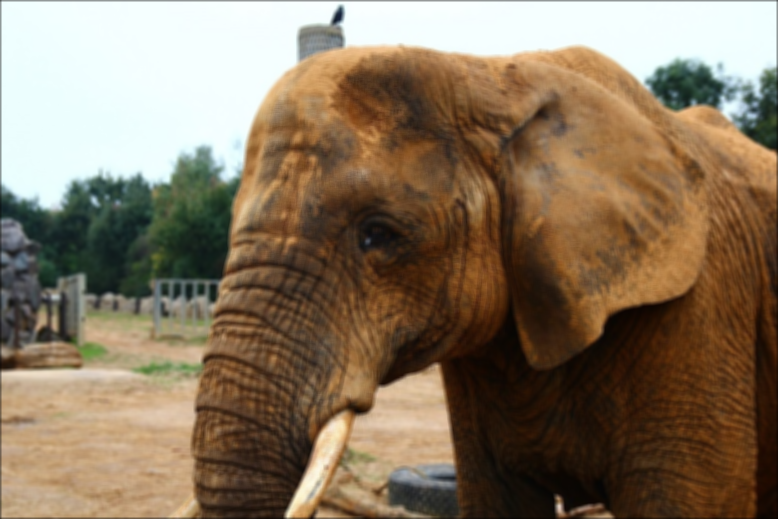

In [21]:
#Averaging with Limited Data Validity

averaged_image = cv2.blur(image, (5, 5), borderType=cv2.BORDER_CONSTANT)

cv2_imshow(averaged_image)

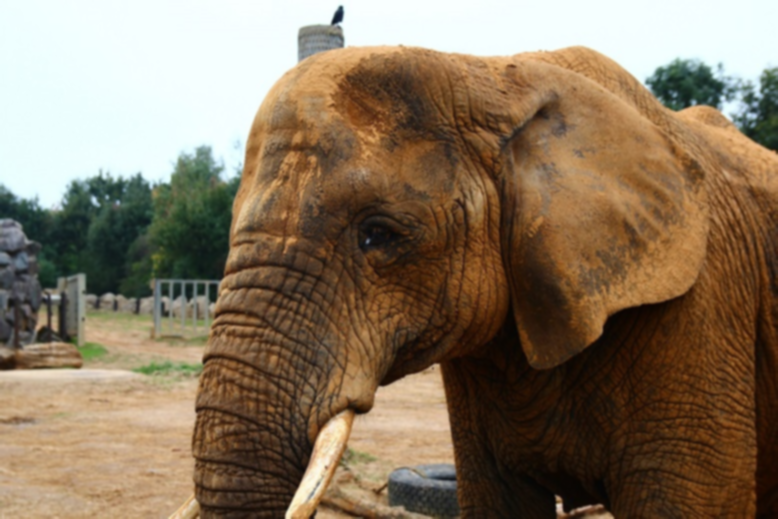

In [22]:
#Averaging Using a Rotating Mask (Gaussian Blur)

gaussian_blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

cv2_imshow(gaussian_blurred_image)

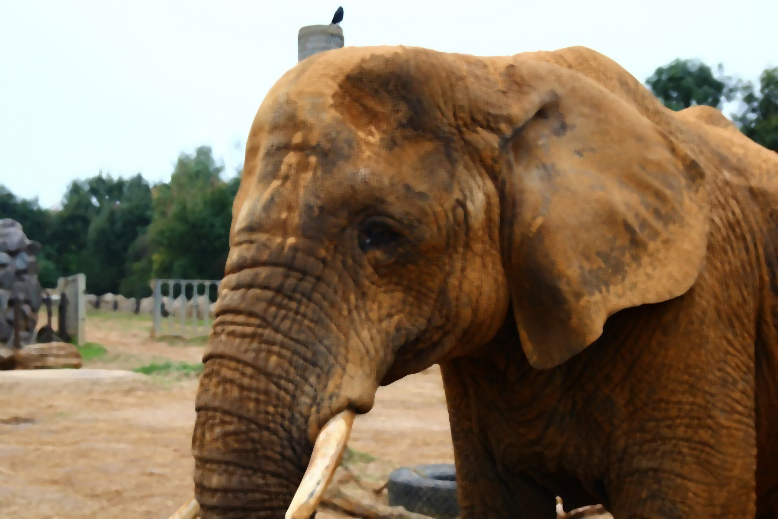

In [23]:
# Median Filter

median_filtered_image = cv2.medianBlur(image, 5)

cv2_imshow(median_filtered_image)


**Averaging Filter:** Smooths an image by averaging the pixel values in a neighborhood, which is useful for reducing small noise.

**Averaging with Limited Data Validity:** Handles edge effects by managing how the filter treats pixels at the borders (e.g., padding).

**Averaging Using a Rotating Mask (Gaussian Blur):** Smooths the image using a Gaussian distribution, better preserving edges compared to simple averaging.

**Median Filter:** Replaces each pixel with the median of surrounding values, making it excellent for removing salt-and-pepper noise without blurring edges.

##Edge Detection

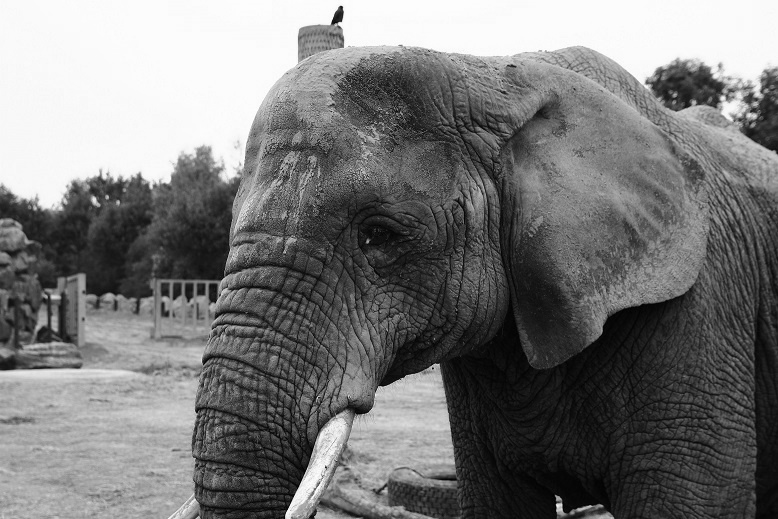

In [24]:
image = cv2.imread('/content/__results___5_0.png', cv2.IMREAD_GRAYSCALE)

cv2_imshow(image)

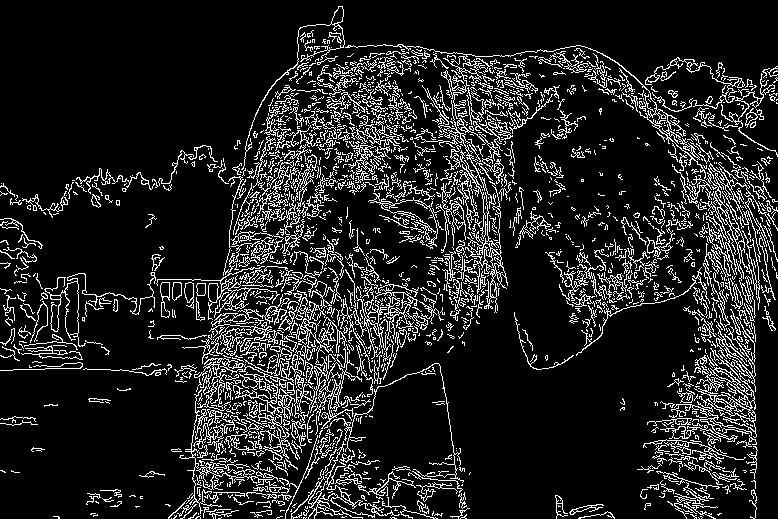

In [25]:
#Canny Edge Detection
edges = cv2.Canny(image, threshold1=100, threshold2=200)

cv2_imshow(edges)

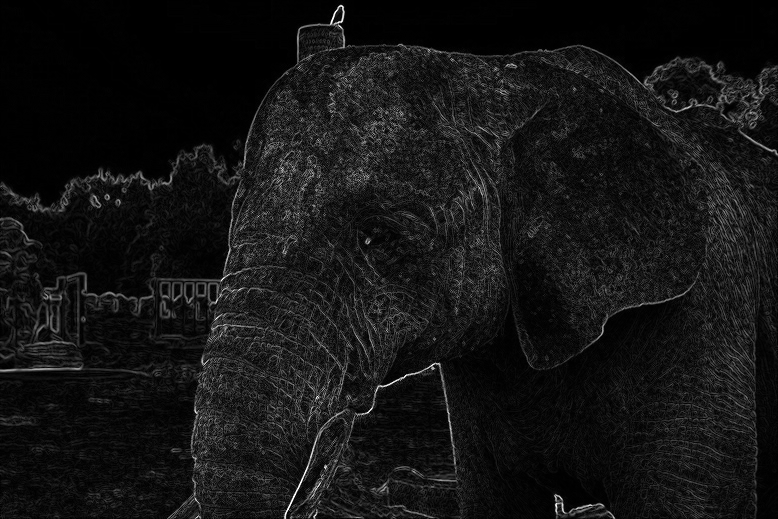

In [26]:
#Sobel Edge Detection

sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=1)
sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=1)

# Combine both Sobel X and Y
sobel_combined = cv2.sqrt(cv2.addWeighted(sobelx**2, 1, sobely**2, 1, 0))

cv2_imshow(sobel_combined)

**You can modify the threshold1 and threshold2 in the Canny algorithm or the ksize in Sobel to control edge sensitivity based on the image and desired result.**

## Image Segmentation

**Image Segmentation** is a process of partitioning an image into different regions or segments to simplify its representation and make it easier to analyze. Two popular segmentation techniques are Threshold-based segmentation and K-means clustering.

In [27]:
image = cv2.imread('/content/__results___5_0.png')

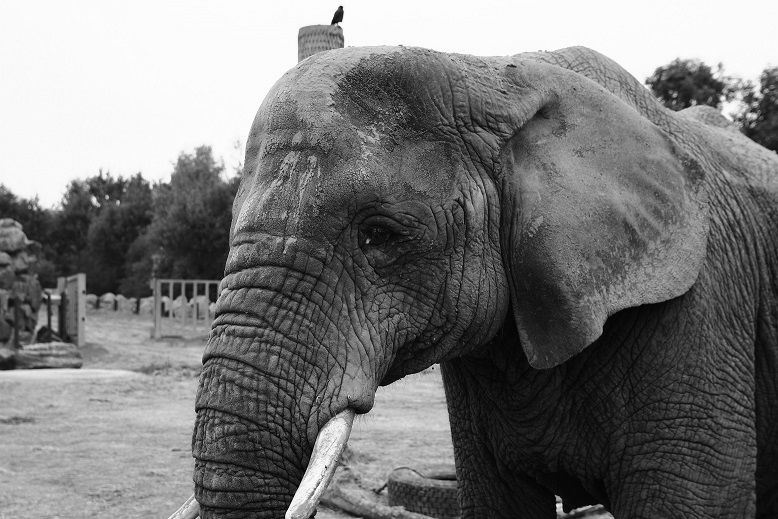

In [28]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv2_imshow(gray_image)

Text(0.5, 1.0, 'Equalized Histogram')

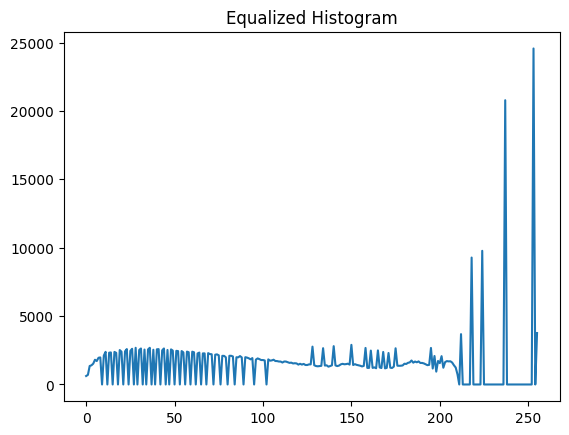

In [29]:
plt.plot(hist_equalized)
plt.title('Equalized Histogram')

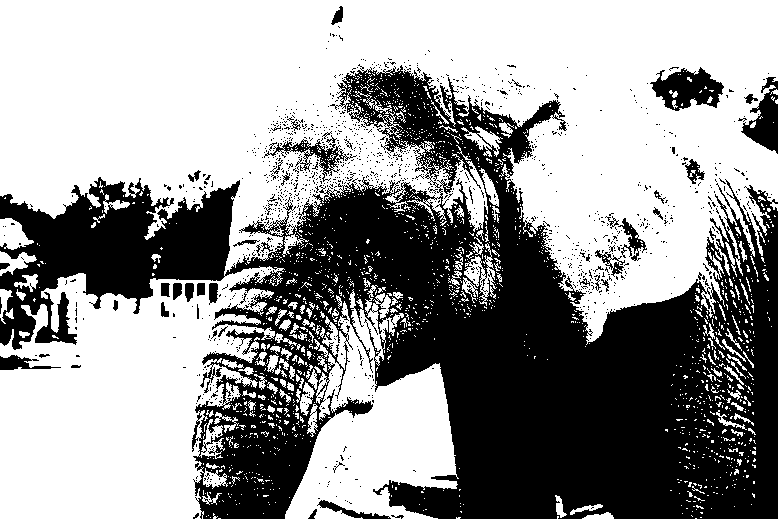

In [30]:
# Threshold-based Segmentation

_, thresholded_image = cv2.threshold(gray_image, 80, 255, cv2.THRESH_BINARY)

cv2_imshow(thresholded_image)

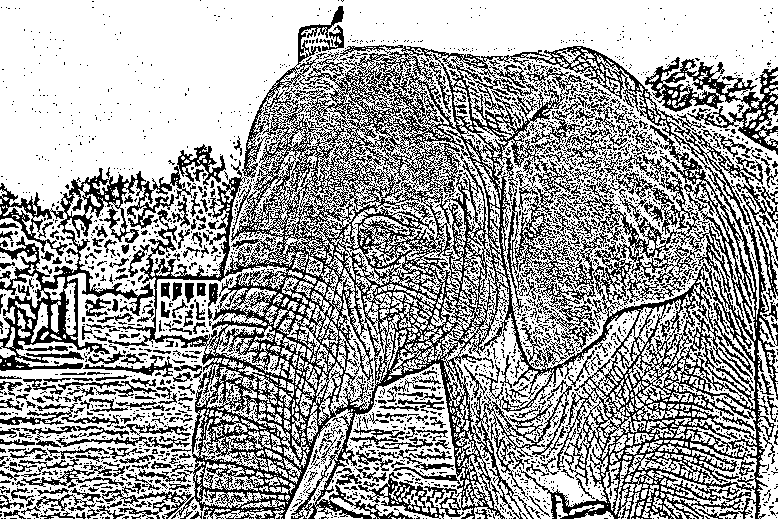

In [31]:
adaptive_thresh = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

cv2_imshow(adaptive_thresh)

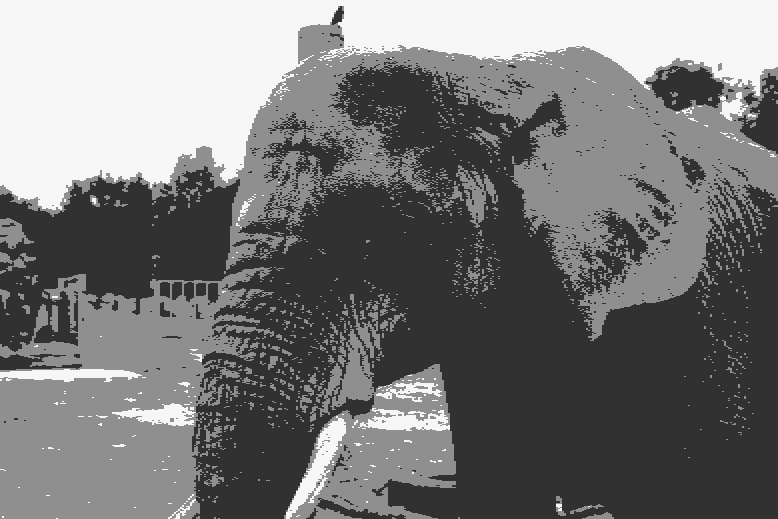

In [32]:
# K-means Clustering for Segmentation

# Reshape the image into a 2D array of pixels
pixels = gray_image.reshape((-1, 2))
pixels = np.float32(pixels)


criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3
_, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert centers to 8-bit values and reshape labels to the shape of the original image
centers = np.uint8(centers)
segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(gray_image.shape)

cv2_imshow(segmented_image)

1. **Threshold-based Segmentation**:
   - Segments the image based on pixel intensity values.
   - Can be simple (using a global threshold) or adaptive (handling varying lighting conditions).
   
2. **K-means Clustering Segmentation**:
   - Segments the image by grouping pixels into `K` clusters based on color (or intensity) similarity.
   - Often used for color segmentation and is effective when you know how many segments to expect.
